# **IMAGE ANALYSIS**
## **Practice 1.** Color image to binary image: Otsu Method.

Created by: Bryan Israel Blancas Pérez.

### Abstract 

In this practice, you will see how to get a binary-image from a color-image. 
This notebook will explain the process starting with standard Red Green Blue space color (sRGB), in order to get a grayscale-image from a color-image, to be able to use Otsu method to make a binary-image.
Algorithms will be explained in isolation for better understanding and at the end they will be used together to fulfill the objective of the practice.

### sRGB

sRGB (standard Red Green Blue) is an RGB color space that HP and Microsoft created cooperatively in 1996. It was subsequently standardized by the IEC. I use sRGB to pass a color-image to a grayscale-image.
The model is described by the following equation:
    
    
   <b><center><h4> G = 0.2126r  +  0.7152g  +  0.0722b </h4></center></b>
    
Where:
<ul>
    <li> 'G' is the new value in grayscale in determinate pixel. </li>
    <li> 'r' is the value of red channel in determinate pixel. </li>
    <li> 'g' is the value of green channel in determinate pixel. </li>
    <li> 'b' is the value of the blue channel in determinate pixel. </li>
</ul>

The following function is the implementation of sRGB model in order to get a grayscale-image from a color-image. 
<ul>
    <li> It receives as a unique parameter an np-array 'image_array', that is the representation of the color-image with 3 channels (RGB). </li>
    <li> It returns an np-array that is the representation of the grayscale-image with only 1 channel. </li>
</ul> 

In [64]:
def colorToGrayscale(image_array):
    
    # Get height and width from image_array (color-image)
    height = image_array.shape[0] 
    width = image_array.shape[1]
    
    # New np-array with only 1 channel due to grayscale, without alpha
    # The size of the new array is the same that the color-image to not alterate the original resolution
    # grayscale_image_array = gs_img_arr
    gs_img_arr = np.zeros((height, width),dtype=np.uint8)
    
    # Double for to traversal image_array
    for i in range(0, height):
        for j in range(0, width):
            
            # Implementation of the sRGB model
            G =  int( 0.2126 * float( image_array[i,j,0] )) # Red Channel 0
            G += int( 0.7152 * float( image_array[i,j,1] )) # Green Channel 1
            G += int( 0.0722 * float( image_array[i,j,2] )) # Blue Channel 2
            
            # Assignment of the new value of determinate pixel in the grayscale-image
            gs_img_arr[i,j] = G
            
    # Return the grayscale-image
    return gs_img_arr

In [65]:
# Load cython
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [66]:
%%cython -a
import numpy as np
def colorToGrayscale_cython(const unsigned char[:,:,:] image_array):
    
    # Get height and width from image_array (color-image)
    cdef int height = image_array.shape[0] 
    cdef int width = image_array.shape[1]
    cdef int i
    cdef int j
    cdef unsigned char G
    
    # New np-array with only 1 channel due to grayscale, without alpha
    # The size of the new array is the same that the color-image to not alterate the original resolution
    # grayscale_image_array = gs_img_arr
    cdef gs_img_arr = np.zeros((height, width),dtype=np.uint8)
    
    # Double for to traversal image_array
    for i in range(0, height):
        for j in range(0, width):
            
            # Implementation of the sRGB model
            G =  int( 0.2126 * float( image_array[i,j,0] )) # Red Channel 0
            G += int( 0.7152 * float( image_array[i,j,1] )) # Green Channel 1
            G += int( 0.0722 * float( image_array[i,j,2] )) # Blue Channel 2
            
            # Assignment of the new value of determinate pixel in the grayscale-image
            gs_img_arr[i,j] = G
            
    # Return the grayscale-image
    return gs_img_arr

### Otsu Method

Otsu method is an algorithm used to perform automatic image thresholding given an histogram of a grayscale-image. It returns a single threshold T that separates pixels into two classes, foreground and background.
This method is particularly usefull and obtains his better performance with grayscale images whose histograms have two Gauss Bell, as the next image shows us.

<img src="teoricalImages/twoGaussBell.png" alt="header" style="height:220px;">

The algorithm exhaustively searches for the threshold that minimizes the intra-class variance, in other words, <b>searches in all the tonal values of the histogram of the image trying to find the maximum value of the variance. Where the maximum is found, T (threshold) is found too.</b> The next equations are required by the algorithm to calcule the variance:

<img src="teoricalImages/w.svg" alt="header" style="height:150px;">
<img src="teoricalImages/m.png" alt="header" style="height:127px;">

Finally, the variance is given by the next equation:

<img src="teoricalImages/r.svg" alt="header" style="width:450px;">


The algorithm is the next:
<ol>
    <li> Compute histogram and probabilities of each intensity level. </li>
    <li> Step through all possible thresholds, from t = 0 to t = 255. </li>
        <ol>
            <li> Update probabilities w0(i) and w1(i) and average m0(i) and m1(i). </li>
            <li> Compute the variance r(i). </li>
        </ol>
    <li>Desired threshold corresponds to the maximum variance r.</li>
</ol>

In the image below, you can see a graphic representation of the Otsu Method, where the red line represents the value of the variance, at the end it's visible how the threshold T is where the variance has his maximum value.

<img src="teoricalImages/otsumethod.gif" alt="header" style="height:300px;">


The following functions are the implementation of the Otsu Algorithm. The functions valueOfW and valueOfM are auxiliar functions that implement the equations given above.
The function otsuMethod is the implementation of the algorithm.
<ul>
    <li> It receives and int denominator, that is the probability calculated from the histogram, and a np-array image_histogram, that is the histogram of the grayscale-image. </li>
    <li> It returns a threshold T. </li>
</ul>

In [67]:
# Function that given a begin and an end, traversal the image_histogram to calculate the value of W
def valueOfW(begin, end, image_histogram):
    w = 0.0
    i = 0
    for i in range(begin, end+1):
        w += image_histogram[i]
    return w

In [68]:
# Function that given a begin and an end, traversal the image_histogram to calculate the value of M
# This function also needs a denominator due to the equation of m
def valueOfM(begin, end, denominator, image_histogram):
    m = 0.0
    i = 0
    for i in range(begin, end+1):
        m += float(i) * float( float(image_histogram[i]) / float(denominator))
    return m

In [69]:
# Function that implements the Otsu Method
def otsuMethod(denominator, image_histogram):
    
    # Initializing threshold T and auxiliar rmax for the variance
    T = 0
    rmax = 0.0

    # For to traversal the tonal values of the image_histogram
    for t in range(255):

        # Calculating w0 and w1
        w0 = valueOfW(0, t, image_histogram) / float(denominator)
        w1 = valueOfW(t+1, 254, image_histogram) / float(denominator)

        # Calculating m0 and m1
        # The if is due to w1 can be 0 at some point of the algoritm, so we need to avoid the divisionByZero error
        if w0 != 0.0:
            m0 = valueOfM(0, t, denominator, image_histogram) / w0
        else:
            m0 = 9999999999.9

        
        if w1 != 0.0:
            m1 = valueOfM(t+1, 254, denominator, image_histogram) / w1
        else:
            m1 = 9999999999.9

        # Calculating the variance r
        r = w0 * w1 * ((m0-m1)**2)

        # Comparing the current value of the variance with the current maximum value of the variance
        if(r > rmax):
            rmax = r
            T = t
    
    # Return threshold T
    return T

### Thresholding

Thresholding is the simplest method of image segmentation. In this implemetation we use thresholding to create a binary-image from a grayscale-image.

This method replace each pixel in an image with a black pixel if the tonal value is less than threshold T, and with a white pixel if the tonal value is greater than T.

The following function is the implementation of the thresholding method for a grayscale-image whith only 1 channel.
<ul>
    <li>It receives a grayscale-image as a np-array (gs_img_arr) and an int T representing the threshold. </li>
    <li>It returns an np-array (arr) that contains the thresholding image, in this case a binary-image.</li>
<ul>



In [70]:
def thresholding(gs_img_arr, T):
    
    # Make a copy of the given image to not modify the original image
    arr = gs_img_arr.copy()
    
    # Get height and width of the given image
    # Channel is equal to 1 because gs_img_arr is a grayscale-image without alpha 
    height = gs_img_arr.shape[0]
    width = gs_img_arr.shape[1]
    channels = 1
    
    # For to traversal the given image
    for i in range(height):
        for j in range(width):
            
            # Comparing if the current tonal value is bigger of less than the threshold T
            if( arr[i,j] < T):
                arr[i,j] = 0
            else:
                arr[i,j] = 255
       
    # Return binary-image
    return arr

In [71]:
%%cython -a 
def thresholding_cython(const unsigned char[:,:] gs_img_arr, const unsigned char T):
    # Get height and width of the given image
    # Channel is equal to 1 because gs_img_arr is a grayscale-image without alpha
    cdef int height = gs_img_arr.shape[0]
    cdef int width = gs_img_arr.shape[1]
    cdef int channels = 1
    cdef int i
    cdef int j 
    
    # Make a copy of the given image to not modify the original image
    cdef unsigned char[:,:] arr = gs_img_arr.copy()
    
    # For to traversal the given image
    for i in range(height):
        for j in range(width):
            
            # Comparing if the current tonal value is bigger of less than the threshold T
            if( arr[i,j] < T):
                arr[i,j] = 0
            else:
                arr[i,j] = 255
    
    # return binary-image
    return arr

### Rest of the code

Now, the rest of the code is shown in order. This section contains the integration of all the functions above as well as the libraries used. Also, the code contains the code lines necessary to show the process and the final result of the algorithm, i.e, the binary-image when the notebook is executed.

**1. Import <a href="https://numpy.org">NumPy</a>, <a href="https://matplotlib.org">matplotlib</a> and Image from <a href="https://pillow.readthedocs.io/en/stable/">PIL</a>**

In [72]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image

**2. Open an image**

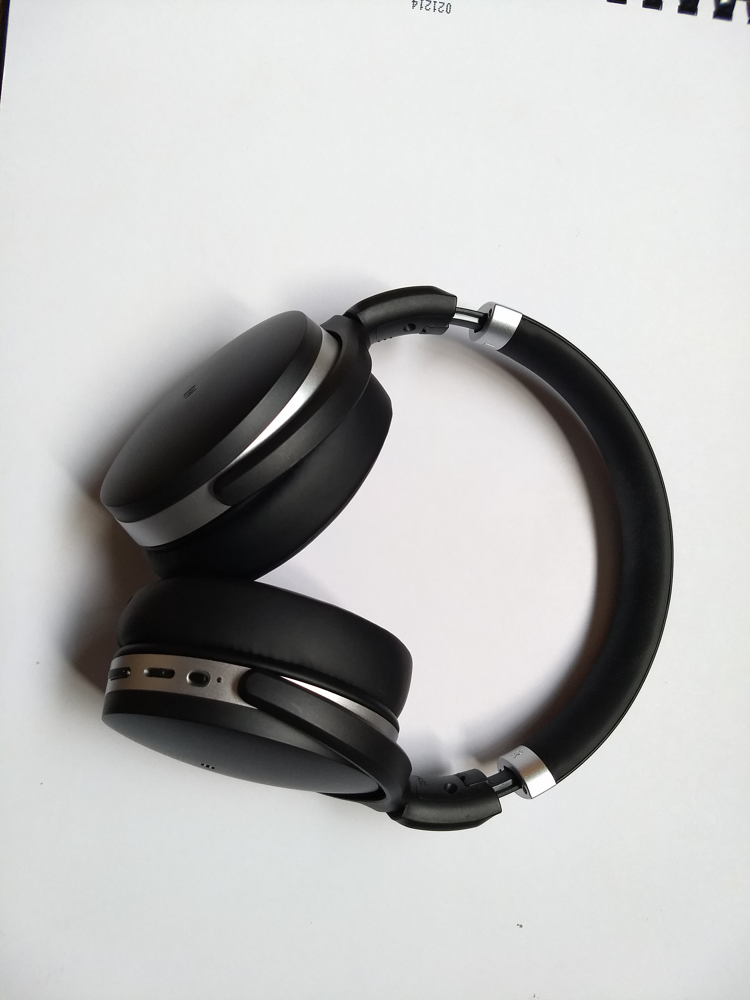

In [73]:
# Path of the image
# image_name = "./testImages/dia_luzsolar_flash.jpg"
# image_name = "./testImages/dia_luzsolar.jpg"
# image_name = "./testImages/dia_pocaluz.jpg"
image_name = "./testImages/dia_pocaluz_flash.jpg"
# image_name = "./testImages/dibujo.jpg"
# image_name = "./testImages/coins.png"
# Open the image using Image.open
image = Image.open(image_name)

# Show the image
image

**3. Convert image to numpy arrar**

Shape of the array: (4032, 3024, 3)


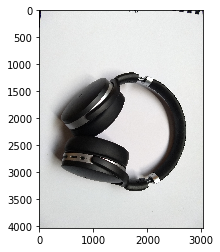

In [74]:
# Convert the image into np array type, using asarray function
image_array = np.asarray(image)

# Print the shape of the image (height, width, channels)
print("Shape of the array: " + str(image_array.shape))

# Show the image in mathPlotLib
plt.imshow(image_array)

**4. Convert color-image to grayscale-image**

CPU times: user 8.19 s, sys: 63.7 ms, total: 8.26 s
Wall time: 8.2 s


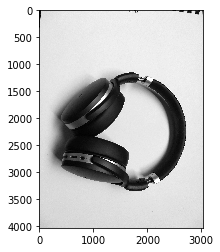

In [75]:
# Call the function colorToGrayScale, the implementation of sRGB color model, to pass the color-image to grayscale-image
# %time gs_img_arr = colorToGrayscale(image_array)
%time gs_img_arr = colorToGrayscale_cython(image_array)

# Show the image as a grayscale-image
plt.imshow(gs_img_arr, cmap = 'gray')

**5. Get histogram of the new grayscale-image**

In [76]:
# Function that returns the histogram of a grayscale-image
def histogramOfGrayscale(gs_img_arr):
    
    # Get height and width from gs_img_arr (grayscale-image)
    height = gs_img_arr.shape[0]
    width = gs_img_arr.shape[1]
    
    # Create a new np-array that will be the histogram
    hist = np.zeros(255, dtype = np.int0);

    # Traversal the grayscale-image to count the number of occurrences of determinate tonal value
    for i in range(0, height):
        for j in range(0, width):
            hist[gs_img_arr[i,j]] += 1
    
    # Return histogram
    return hist

In [77]:
%%cython -a
import numpy as np

# Function that returns the histogram of a grayscale-image
def histogramOfGrayscale_cython(const unsigned char[:,:] gs_img_arr):
    
    # Get height and width from gs_img_arr (grayscale-image)
    cdef int height = gs_img_arr.shape[0]
    cdef int width = gs_img_arr.shape[1]
    
    # Create a new np-array that will be the histogram
    #cdef hist = np.zeros(255, dtype = np.int0);
    cdef unsigned long int[255] hist = np.zeros(255, dtype = np.uint)
    
    # Traversal the grayscale-image to count the number of occurrences of determinate tonal value
    for i in range(0, height):
        for j in range(0, width):
            hist[gs_img_arr[i,j]] += 1
    
    # Return histogram
    return hist

CPU times: user 37.5 ms, sys: 0 ns, total: 37.5 ms
Wall time: 37.6 ms


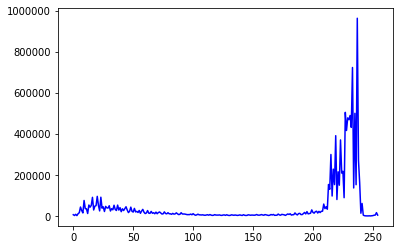

In [78]:
# Call the histogramOfGrayscale function
# %time image_histogram = histogramOfGrayscale(gs_img_arr)
%time image_histogram = histogramOfGrayscale_cython(gs_img_arr)

# Show the histogram of the grayscale-image
plt.plot(image_histogram, color = "b")
plt.show()

**6. Using Otsu Method function**

In [79]:
# Calculate denominator in order to obtains the probability por the Otsu Method
denominator =  image_array.shape[0] * image_array.shape[1]

# Call the otsuMethod function
%time T = otsuMethod(denominator, image_histogram)
# %time T = otsuMethod_cython(denominator, image_histogram)

# Print the selected value of T
print("T: "+str(T))

CPU times: user 99.4 ms, sys: 0 ns, total: 99.4 ms
Wall time: 99.1 ms
T: 134


**7. Thresholding with T calculated with Otsu method to create the binary-image**

CPU times: user 52.3 ms, sys: 3.81 ms, total: 56.1 ms
Wall time: 56.4 ms


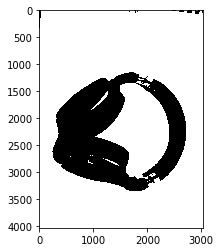

In [80]:
# Call the function thresholding
# %time binary_image_arr = thresholding(gs_img_arr, T)
%time binary_image_arr = thresholding_cython(gs_img_arr, T)

# Show the binary-image
plt.imshow(binary_image_arr, cmap = 'gray')

### End of the code